In [ ]:
import pandas as pd
import numpy as np

In [ ]:
from google.colab import files
myfile = files.upload()

Saving titlelist.xlsx to titlelist (1).xlsx


In [ ]:
from google.colab import files
myfile = files.upload()

Saving title_s.xlsx to title_s (1).xlsx


In [ ]:
title1 = pd.read_excel("titlelist.xlsx")

In [ ]:
title2 = pd.read_excel("title_s.xlsx")

In [ ]:
title1.head(10)

,Title
0,Sentiment analysis algorithms and applications...
1,Deep learning for sentiment analysis: A survey
2,Techniques and applications for sentiment anal...
3,A survey on sentiment analysis challenges
4,Sentiment analysis: An overview
5,Sentiment analysis: A combined approach
6,A practical guide to sentiment analysis
7,Comparing and combining sentiment analysis met...
8,Using appraisal groups for sentiment analysis
9,Sentiment analysis and subjectivity.


In [ ]:
title2

,Title
0,Fusing Syntactic Structure Information and Lex...
1,Bayesian game model based unsupervised sentime...
2,A Siamese Neural Network for Learning Semantic...
3,Stance detection in tweets: A topic modeling a...
4,Text mining-based four-step framework for smar...
5,A hybrid composite features based sentence lev...
6,Aspect-level sentiment analysis: A survey of g...
7,Hybrid sentiment analysis with textual and int...
8,Using text highlighting in product research: C...
9,Towards personalized persuasive dialogue gener...


In [ ]:
title1["Title"] = title1["Title"].apply(lambda x : x.split("]")[-1])
title1

,Title
0,Sentiment analysis algorithms and applications...
1,Deep learning for sentiment analysis: A survey
2,Techniques and applications for sentiment anal...
3,A survey on sentiment analysis challenges
4,Sentiment analysis: An overview
5,Sentiment analysis: A combined approach
6,A practical guide to sentiment analysis
7,Comparing and combining sentiment analysis met...
8,Using appraisal groups for sentiment analysis
9,Sentiment analysis and subjectivity.


In [ ]:
title = pd.concat([title1, title2])

In [ ]:
title= title.reset_index()

In [ ]:
title

,index,Title
0,0,Sentiment analysis algorithms and applications...
1,1,Deep learning for sentiment analysis: A survey
2,2,Techniques and applications for sentiment anal...
3,3,A survey on sentiment analysis challenges
4,4,Sentiment analysis: An overview
5,5,Sentiment analysis: A combined approach
6,6,A practical guide to sentiment analysis
7,7,Comparing and combining sentiment analysis met...
8,8,Using appraisal groups for sentiment analysis
9,9,Sentiment analysis and subjectivity.


In [ ]:
title.duplicated().sum()

0

In [ ]:
len(title)

2760

Text(0, 0.5, 'count')

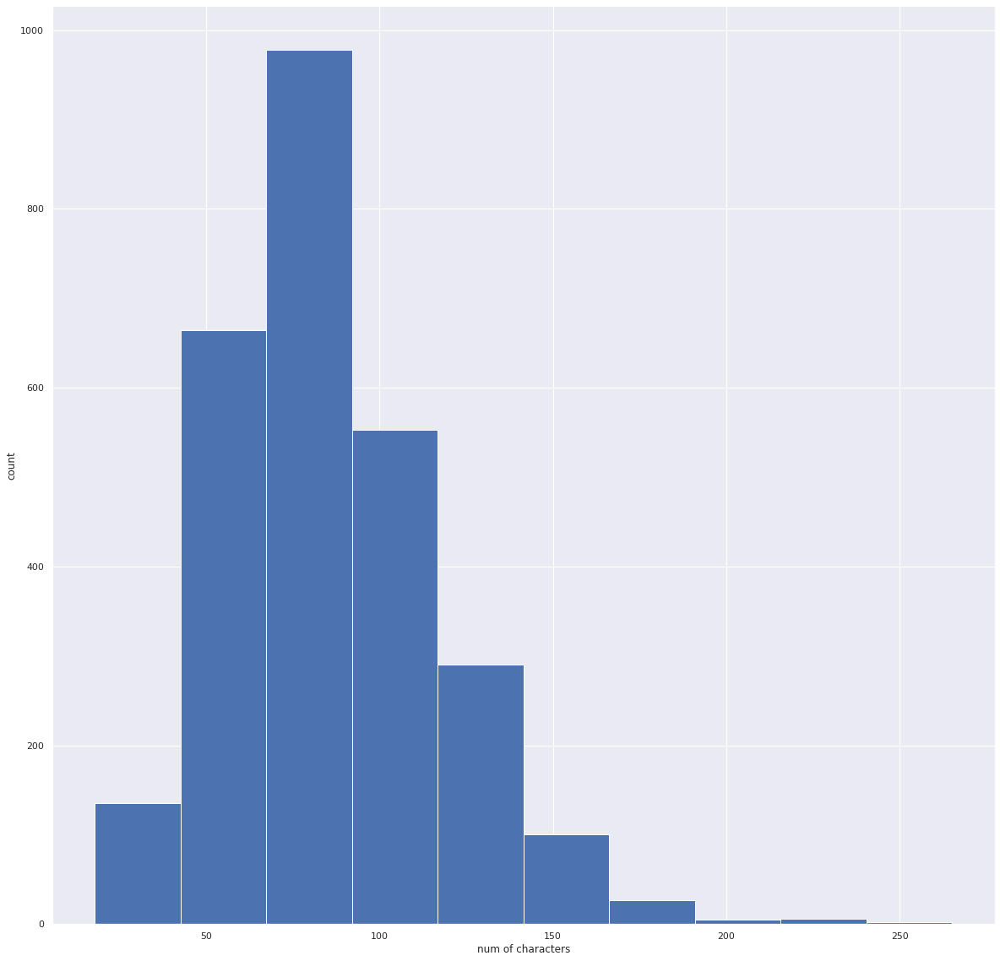

In [ ]:
# 글자수 히스토그램
ax = title["Title"].str.len().hist()

ax.set_xlabel("num of characters")
ax.set_ylabel("count")

Text(0, 0.5, 'count')

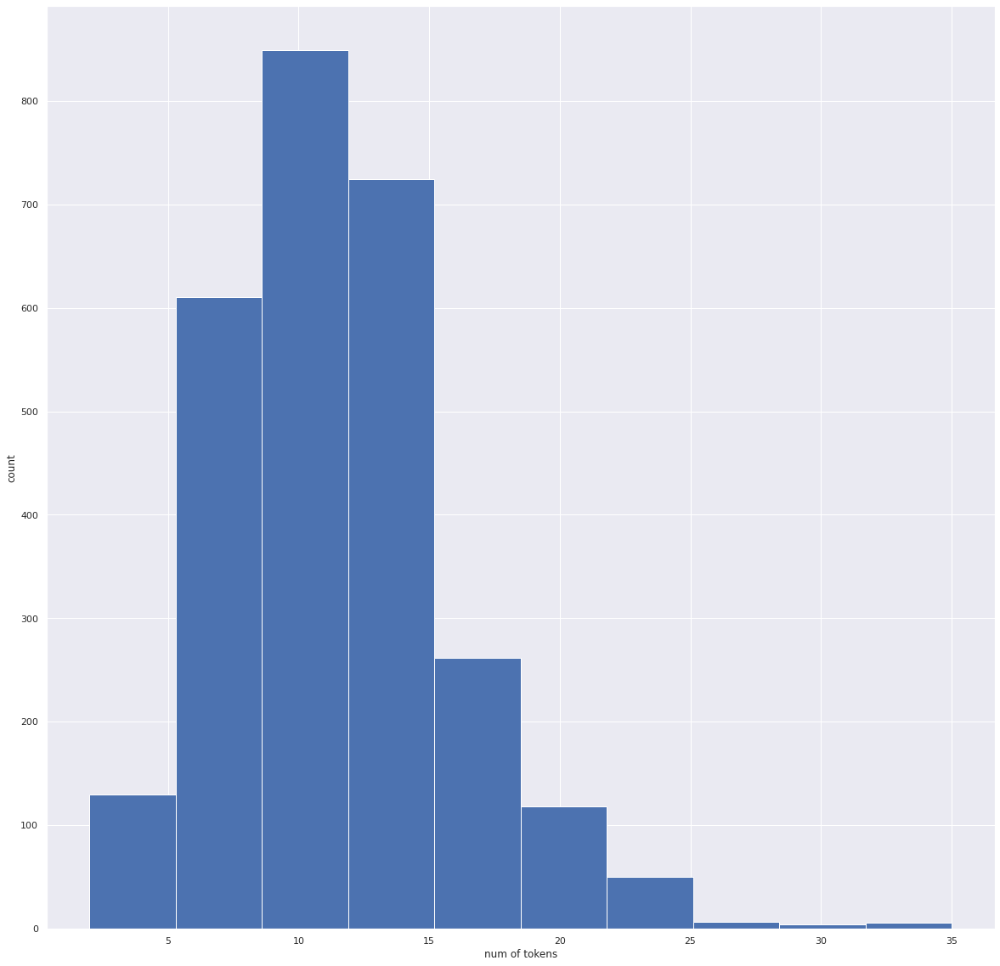

In [ ]:
# 토큰 수 분포 : 띄어쓰기, 탭, 줄바꿈 등의 구분자로 구분된 경우 토큰으로 봄
ax2 = title["Title"].str.split().map(lambda x:len(x)).hist()

ax2.set_xlabel("num of tokens")
ax2.set_ylabel("count")

Text(0, 0.5, 'count')

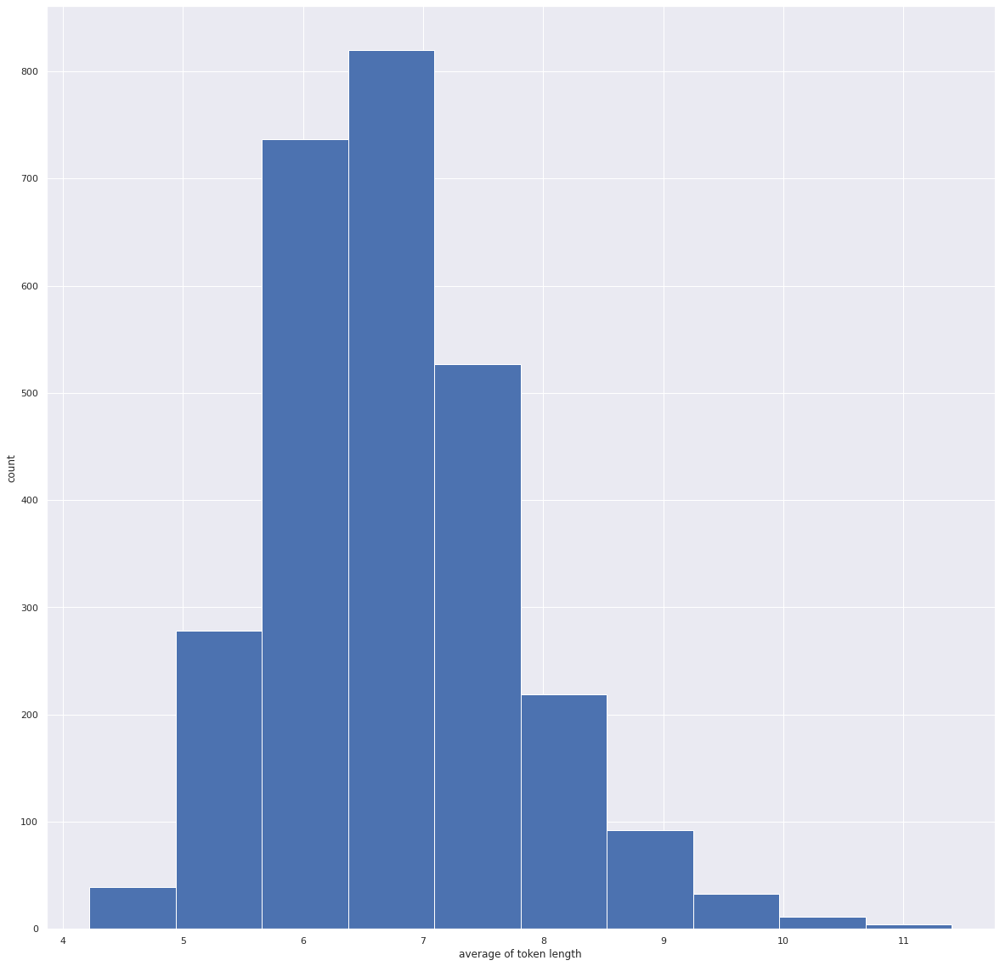

In [ ]:
# 토큰별 길이 평균 분포
ax = title['Title'].str.split().\
   apply(lambda x : [len(i) for i in x]). \
   map(lambda x: np.mean(x)).hist()

ax.set_xlabel('average of token length')
ax.set_ylabel('count')

In [ ]:
# 단어개수기반 통계
titlelist= list(title["Title"])
tokenized_list = [r.split() for r in titlelist]
list_len_by_token = [len(t) for t in tokenized_list]

print("제목의 최대 길이 : {}".format(np.max(list_len_by_token)))
print("제목의 최소 길이 : {}".format(np.min(list_len_by_token)))
print("제목의 평균 길이 : {:.2f}".format(np.mean(list_len_by_token)))
print("제목의 길이 표준편차 : {:.2f}".format(np.std(list_len_by_token)))
print("제목의 중간 길이 : {}".format(np.median(list_len_by_token)))
print("제1사분위 길이 : {}".format(np.percentile(list_len_by_token, 25)))
print("제3사분위 길이 : {}".format(np.percentile(list_len_by_token, 75)))

제목의 최대 길이 : 35
제목의 최소 길이 : 2
제목의 평균 길이 : 11.41
제목의 길이 표준편차 : 4.36
제목의 중간 길이 : 11.0
제1사분위 길이 : 8.0
제3사분위 길이 : 14.0


In [ ]:
title.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2760 entries, 0 to 2759
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   index   2760 non-null   int64 
 1   Title   2760 non-null   object
dtypes: int64(1), object(1)
memory usage: 43.2+ KB


In [ ]:
title.isna().sum()

index    0
Title    0
dtype: int64

In [ ]:
!pip install transformers datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from transformers import DistilBertTokenizer, TFDistilBertModel
from datasets import *
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

In [ ]:
title["Title"]=title["Title"].astype("str")

In [ ]:
# dataset = load_dataset("xlsx", data_files ="titlelist.xlsx" )

In [ ]:
title

,index,Title
0,0,Sentiment analysis algorithms and applications...
1,1,Deep learning for sentiment analysis: A survey
2,2,Techniques and applications for sentiment anal...
3,3,A survey on sentiment analysis challenges
4,4,Sentiment analysis: An overview
5,5,Sentiment analysis: A combined approach
6,6,A practical guide to sentiment analysis
7,7,Comparing and combining sentiment analysis met...
8,8,Using appraisal groups for sentiment analysis
9,9,Sentiment analysis and subjectivity.


In [ ]:
# def preprocessing(data):
#     output = tokenizer.encode(title["Title"], max_length=30, pad_to_max_length=True, truncation=True)

In [ ]:
title

,index,Title
0,0,Sentiment analysis algorithms and applications...
1,1,Deep learning for sentiment analysis: A survey
2,2,Techniques and applications for sentiment anal...
3,3,A survey on sentiment analysis challenges
4,4,Sentiment analysis: An overview
5,5,Sentiment analysis: A combined approach
6,6,A practical guide to sentiment analysis
7,7,Comparing and combining sentiment analysis met...
8,8,Using appraisal groups for sentiment analysis
9,9,Sentiment analysis and subjectivity.


In [ ]:
sentences = title["Title"].values

In [ ]:
sentences

array(['Sentiment analysis algorithms and applications: A survey',
       'Deep learning for sentiment analysis: A survey',
       'Techniques and applications for sentiment analysis', ...,
       'A novel self-learning approach to overcome incompatibility on TripAdvisor reviews',
       'Evaluating Public Sentiments of Covid-19 Vaccine Tweets Using Machine Learning Techniques',
       'The psychiatrist as gatekeeper in requests for assisted suicide: a qualitative study | [Le psychiatre comme « gatekeeper »: une étude qualitative sur le rôle du psychiatre dans les demandes de suicide assisté]'],
      dtype=object)

In [ ]:
#단어별로 나누기

In [ ]:
# sentences = sentences.astype("str")

In [ ]:
title["Title_embed"] = title["Title"].apply(lambda x : tokenizer(x))

In [ ]:
title

,index,Title,Title_embed
0,0,Sentiment analysis algorithms and applications...,"[input_ids, attention_mask]"
1,1,Deep learning for sentiment analysis: A survey,"[input_ids, attention_mask]"
2,2,Techniques and applications for sentiment anal...,"[input_ids, attention_mask]"
3,3,A survey on sentiment analysis challenges,"[input_ids, attention_mask]"
4,4,Sentiment analysis: An overview,"[input_ids, attention_mask]"
5,5,Sentiment analysis: A combined approach,"[input_ids, attention_mask]"
6,6,A practical guide to sentiment analysis,"[input_ids, attention_mask]"
7,7,Comparing and combining sentiment analysis met...,"[input_ids, attention_mask]"
8,8,Using appraisal groups for sentiment analysis,"[input_ids, attention_mask]"
9,9,Sentiment analysis and subjectivity.,"[input_ids, attention_mask]"


In [ ]:
title["Title_embed"][0]

{'input_ids': [101, 15792, 4106, 13792, 1998, 5097, 1024, 1037, 5002, 102], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}

In [ ]:
title["Title_embed"]= title["Title_embed"].apply(lambda x : x["input_ids"])

In [ ]:
title

,index,Title,Title_embed
0,0,Sentiment analysis algorithms and applications...,"[101, 15792, 4106, 13792, 1998, 5097, 1024, 10..."
1,1,Deep learning for sentiment analysis: A survey,"[101, 2784, 4083, 2005, 15792, 4106, 1024, 103..."
2,2,Techniques and applications for sentiment anal...,"[101, 5461, 1998, 5097, 2005, 15792, 4106, 102]"
3,3,A survey on sentiment analysis challenges,"[101, 1037, 5002, 2006, 15792, 4106, 7860, 102]"
4,4,Sentiment analysis: An overview,"[101, 15792, 4106, 1024, 2019, 19184, 102]"
5,5,Sentiment analysis: A combined approach,"[101, 15792, 4106, 1024, 1037, 4117, 3921, 102]"
6,6,A practical guide to sentiment analysis,"[101, 1037, 6742, 5009, 2000, 15792, 4106, 102]"
7,7,Comparing and combining sentiment analysis met...,"[101, 13599, 1998, 11566, 15792, 4106, 4725, 102]"
8,8,Using appraisal groups for sentiment analysis,"[101, 2478, 10439, 14995, 12002, 2967, 2005, 1..."
9,9,Sentiment analysis and subjectivity.,"[101, 15792, 4106, 1998, 3395, 7730, 1012, 102]"


In [ ]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE # 시각화

import seaborn as sns
import matplotlib.pyplot as plt

from nltk.cluster import KMeansClusterer, cosine_distance
import nltk

In [ ]:
title

,index,Title,Title_embed
0,0,Sentiment analysis algorithms and applications...,"[101, 15792, 4106, 13792, 1998, 5097, 1024, 10..."
1,1,Deep learning for sentiment analysis: A survey,"[101, 2784, 4083, 2005, 15792, 4106, 1024, 103..."
2,2,Techniques and applications for sentiment anal...,"[101, 5461, 1998, 5097, 2005, 15792, 4106, 102]"
3,3,A survey on sentiment analysis challenges,"[101, 1037, 5002, 2006, 15792, 4106, 7860, 102]"
4,4,Sentiment analysis: An overview,"[101, 15792, 4106, 1024, 2019, 19184, 102]"
5,5,Sentiment analysis: A combined approach,"[101, 15792, 4106, 1024, 1037, 4117, 3921, 102]"
6,6,A practical guide to sentiment analysis,"[101, 1037, 6742, 5009, 2000, 15792, 4106, 102]"
7,7,Comparing and combining sentiment analysis met...,"[101, 13599, 1998, 11566, 15792, 4106, 4725, 102]"
8,8,Using appraisal groups for sentiment analysis,"[101, 2478, 10439, 14995, 12002, 2967, 2005, 1..."
9,9,Sentiment analysis and subjectivity.,"[101, 15792, 4106, 1998, 3395, 7730, 1012, 102]"


In [ ]:
corpus_embedding = list(title["Title_embed"])
corpus_embedding= corpus_embedding [0:2760]


In [ ]:
title

,index,Title,Title_embed
0,0,Sentiment analysis algorithms and applications...,"[101, 15792, 4106, 13792, 1998, 5097, 1024, 10..."
1,1,Deep learning for sentiment analysis: A survey,"[101, 2784, 4083, 2005, 15792, 4106, 1024, 103..."
2,2,Techniques and applications for sentiment anal...,"[101, 5461, 1998, 5097, 2005, 15792, 4106, 102]"
3,3,A survey on sentiment analysis challenges,"[101, 1037, 5002, 2006, 15792, 4106, 7860, 102]"
4,4,Sentiment analysis: An overview,"[101, 15792, 4106, 1024, 2019, 19184, 102]"
5,5,Sentiment analysis: A combined approach,"[101, 15792, 4106, 1024, 1037, 4117, 3921, 102]"
6,6,A practical guide to sentiment analysis,"[101, 1037, 6742, 5009, 2000, 15792, 4106, 102]"
7,7,Comparing and combining sentiment analysis met...,"[101, 13599, 1998, 11566, 15792, 4106, 4725, 102]"
8,8,Using appraisal groups for sentiment analysis,"[101, 2478, 10439, 14995, 12002, 2967, 2005, 1..."
9,9,Sentiment analysis and subjectivity.,"[101, 15792, 4106, 1998, 3395, 7730, 1012, 102]"


In [ ]:
max_len = max(len(title) for title in corpus_embedding)

In [ ]:
max_len

109

In [ ]:
# padding
for i in corpus_embedding:
  while len(i) < max_len:
    i.append(0)

In [ ]:
corpus_embedding

[[101,
  15792,
  4106,
  13792,
  1998,
  5097,
  1024,
  1037,
  5002,
  102,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [101,
  2784,
  4083,
  2005,
  15792,
  4106,
  1024,
  1037,
  5002,
  102,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [ ]:
# elbow
inertia = []
for  i in range(1,20):
  kmeans_plus = KMeans(n_clusters=i, init="k-means++", random_state=0)
  kmeans_plus.fit(corpus_embedding)
  inertia.append(kmeans_plus.inertia_)


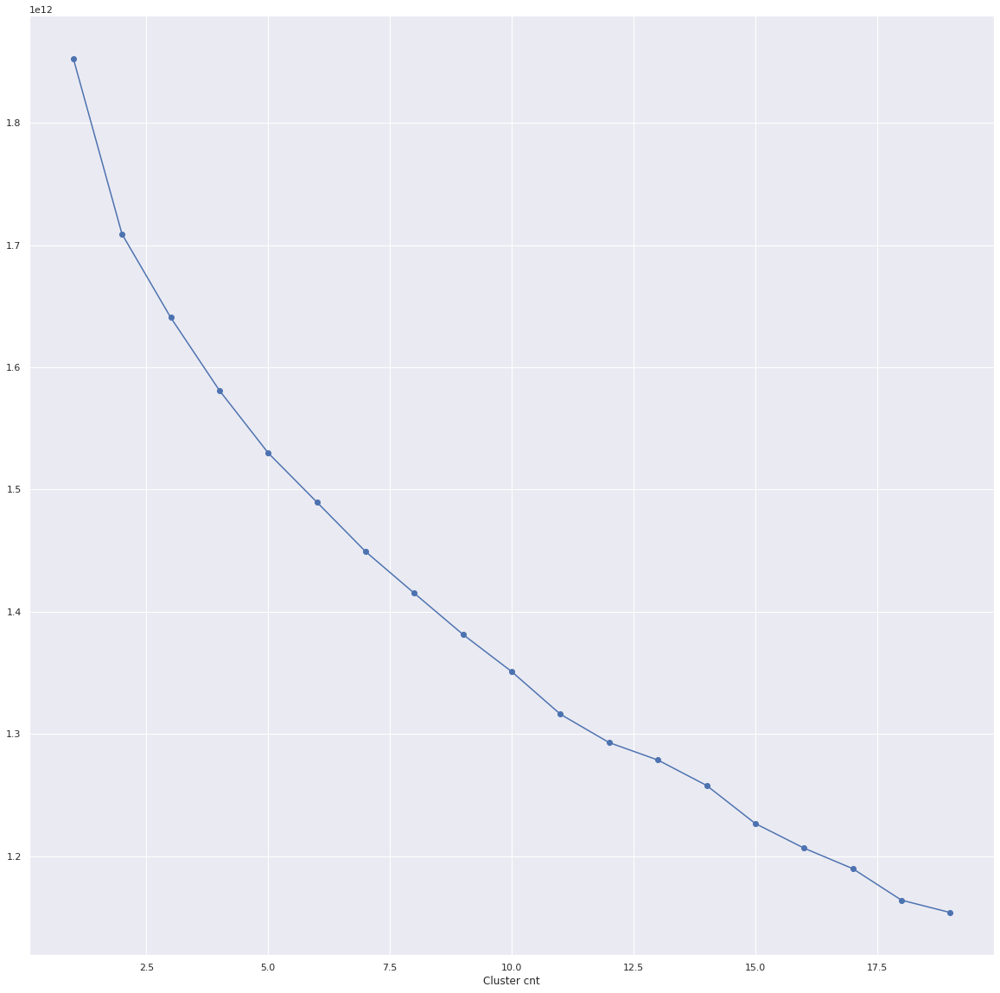

In [ ]:
plt.plot(range(1,20), inertia, marker="o")
plt.xlabel("Cluster cnt")
plt.show()

In [ ]:
num_clusters =7
clustering_model = KMeans(n_clusters= num_clusters)
clustering_model.fit(corpus_embedding)
cluster_assignment = clustering_model.labels_

In [ ]:
title

,index,Title,Title_embed
0,0,Sentiment analysis algorithms and applications...,"[101, 15792, 4106, 13792, 1998, 5097, 1024, 10..."
1,1,Deep learning for sentiment analysis: A survey,"[101, 2784, 4083, 2005, 15792, 4106, 1024, 103..."
2,2,Techniques and applications for sentiment anal...,"[101, 5461, 1998, 5097, 2005, 15792, 4106, 102..."
3,3,A survey on sentiment analysis challenges,"[101, 1037, 5002, 2006, 15792, 4106, 7860, 102..."
4,4,Sentiment analysis: An overview,"[101, 15792, 4106, 1024, 2019, 19184, 102, 0, ..."
5,5,Sentiment analysis: A combined approach,"[101, 15792, 4106, 1024, 1037, 4117, 3921, 102..."
6,6,A practical guide to sentiment analysis,"[101, 1037, 6742, 5009, 2000, 15792, 4106, 102..."
7,7,Comparing and combining sentiment analysis met...,"[101, 13599, 1998, 11566, 15792, 4106, 4725, 1..."
8,8,Using appraisal groups for sentiment analysis,"[101, 2478, 10439, 14995, 12002, 2967, 2005, 1..."
9,9,Sentiment analysis and subjectivity.,"[101, 15792, 4106, 1998, 3395, 7730, 1012, 102..."


In [ ]:
cluster_df=title.drop(columns =["Title_embed"])

In [ ]:
cluster_df["cluster"] = cluster_assignment

In [ ]:
cluster_df

,index,Title,cluster
0,0,Sentiment analysis algorithms and applications...,3
1,1,Deep learning for sentiment analysis: A survey,5
2,2,Techniques and applications for sentiment anal...,2
3,3,A survey on sentiment analysis challenges,5
4,4,Sentiment analysis: An overview,2
5,5,Sentiment analysis: A combined approach,3
6,6,A practical guide to sentiment analysis,2
7,7,Comparing and combining sentiment analysis met...,5
8,8,Using appraisal groups for sentiment analysis,0
9,9,Sentiment analysis and subjectivity.,3


클러스터 시각화(tSNE)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


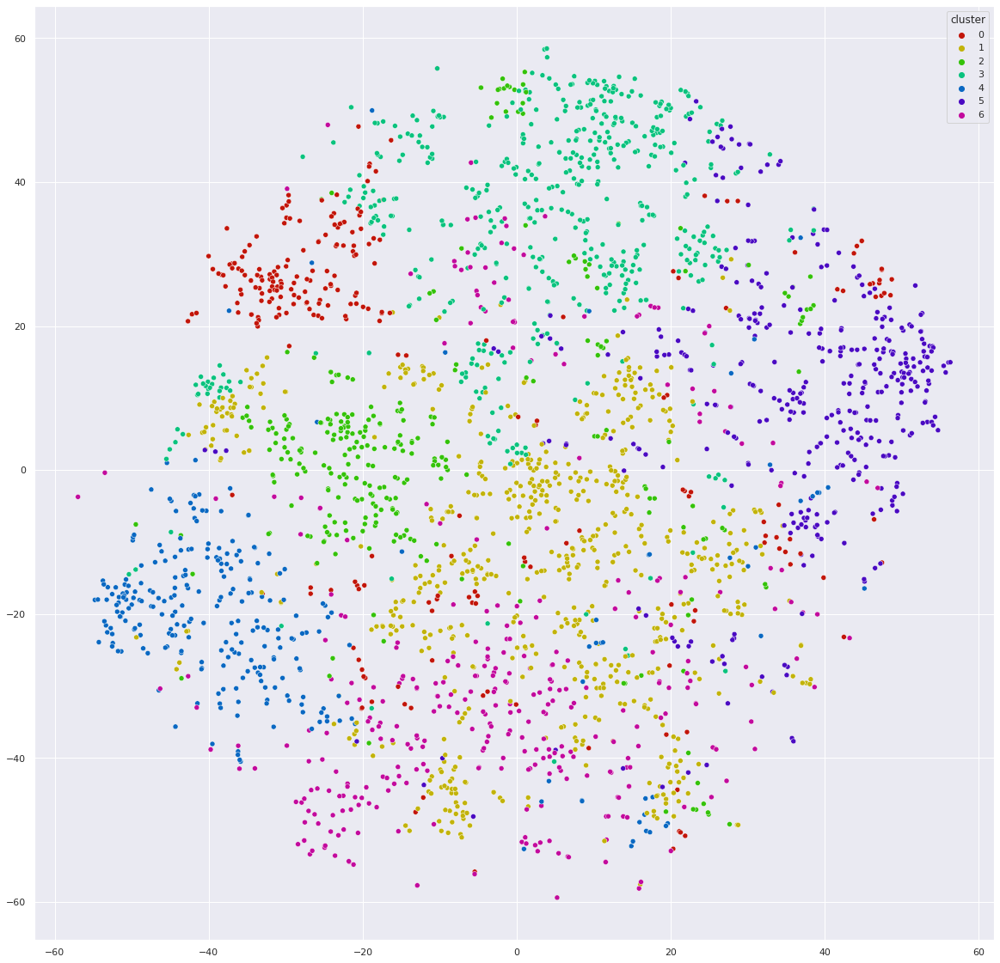

In [ ]:
n_components=2
# x= cluster_df["Title"].to_list()
# y = cluster_df["cluster"].to_list()

model =TSNE(n_components=n_components)
x = model.fit_transform(corpus_embedding)

sns.set(rc = {"figure.figsize" : (20, 20)})

# color
palette = sns.hls_palette(7, l=.4, s=.9)

sns.scatterplot(x[:,0], x[:,1], hue = cluster_df["cluster"], legend="full", palette=palette)

plt.show()

In [ ]:
print(len(cluster_df[cluster_df["cluster"]==0]))
print(len(cluster_df[cluster_df["cluster"]==1]))
print(len(cluster_df[cluster_df["cluster"]==2]))
print(len(cluster_df[cluster_df["cluster"]==3]))
print(len(cluster_df[cluster_df["cluster"]==4]))
print(len(cluster_df[cluster_df["cluster"]==5]))
print(len(cluster_df[cluster_df["cluster"]==6]))

257
664
294
524
282
388
351


군집 결과 확인 + TF IDF

In [ ]:
 from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
 tfidf= TfidfVectorizer()

In [ ]:
import re
import nltk
nltk.download("punkt")
nltk.download("averaged_perceptron_tagger")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
def extract_nn(x):
  NN_word = []
  for word, pos in x:
    if "NN" in pos:
      NN_word.append(word)
  return NN_word

클러스터1

In [ ]:
# pd.set_option("display.max_rows",None)
print("cluster0")
print(pd.DataFrame(cluster_df[cluster_df["cluster"]==0]["Title"]))

cluster0
                                                  Title
8         Using appraisal groups for sentiment analysis
13    Approaches, tools and applications for sentime...
16    Joint sentiment/topic model for sentiment anal...
24            A survey of multimodal sentiment analysis
38    Sentiment analysis: Mining opinions, sentiment...
43    An introduction to concept-level sentiment ana...
55     A review of feature extraction in sentiment a...
59    Marketing research: The role of sentiment anal...
73     A review on sentiment analysis methodologies,...
74    A survey of opinion mining and sentiment analysis
82    International sentiment analysis for news and ...
90     A survey on the role of negation in sentiment...
98    New avenues in opinion mining and sentiment an...
101   Moodlens: an emoticon-based sentiment analysis...
104   Comparative analysis of the techniques for sen...
112   Application of machine learning techniques to ...
114    A survey on opinion mining and s

In [ ]:
cluster0_list = cluster_df[cluster_df["cluster"]==0]["Title"]

In [ ]:
cluster0_tfidf = tfidf.fit_transform(cluster0_list).toarray()
n_top=50
importance = np.argsort(np.asarray(cluster0_tfidf.sum(axis=0)).ravel())[::-1]
tfidf_feature_names= np.array(tfidf.get_feature_names())
cluster0_top = pd.DataFrame(tfidf_feature_names[importance[:n_top]])

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
cluster0_top

,0
0,sentiment
1,analysis
2,of
3,for
4,and
5,based
6,on
7,in
8,using
9,learning


In [ ]:
clean_cluster0_list = cluster0_top.replace("!","").replace(",","").replace("-","").replace("'","").replace(":","").replace("?","")

In [ ]:
tokens_pos0 = clean_cluster0_list.apply(lambda x : nltk.pos_tag(x))

In [ ]:
extract0 = tokens_pos0.apply(lambda x : extract_nn(x))
extract0

,0
0,sentiment
1,analysis
2,twitter
3,deep
4,classification
5,media
6,data
7,reviews
8,multimodal
9,survey


클러스터 2

In [ ]:
print("cluster2")
print(pd.DataFrame(cluster_df[cluster_df["cluster"]==2]["Title"]))

cluster2
                                                  Title
2     Techniques and applications for sentiment anal...
4                       Sentiment analysis: An overview
6               A practical guide to sentiment analysis
14    An empirical study of sentiment analysis for c...
29     Sentiment analysis: An overview from linguistics
35               SA-E: sentiment analysis for education
49           Affective computing and sentiment analysis
64    The impact of features extraction on the senti...
65     A comprehensive survey on sentiment analysis:...
67     Sentic patterns: Dependency-based rules for c...
78     Machine learning approach for sentiment analysis
87           SentiFul: A lexicon for sentiment analysis
124    A study of information retrieval weighting sc...
128   Towards multimodal sentiment analysis: Harvest...
134   Lexicon-based sentiment analysis: Comparative ...
140    A Preliminary Investigation into Sentiment An...
147       Benchmarking twitter sentimen

In [ ]:
# cluster2_list = list(cluster_df[cluster_df["cluster"]==2]["Title"])
# cluster2_list = cluster2_list[0:678]


In [ ]:
cluster2_list = cluster_df[cluster_df["cluster"]==2]["Title"]

In [ ]:
cluster2_tfidf = tfidf.fit_transform(cluster2_list).toarray() # cluster2_list
# np.argsort(cluster2_tfidf.toarray())[:,-1:]
# cluster2_top = pd.DataFrame(np.argsort(cluster2_tfidf.toarray())[:, -1:])

n_top=50
importance = np.argsort(np.asarray(cluster2_tfidf.sum(axis=0)).ravel())[::-1]
tfidf_feature_names= np.array(tfidf.get_feature_names())
print(pd.DataFrame(tfidf_feature_names[importance[:n_top]]))
cluster2_top = pd.DataFrame(tfidf_feature_names[importance[:n_top]])

                 0
0        sentiment
1         analysis
2               of
3              for
4              and
5              the
6               on
7            based
8               in
9            using
10        learning
11         twitter
12           covid
13              19
14          social
15              to
16            with
17           study
18              an
19         machine
20           media
21        approach
22            from
23          tweets
24          arabic
25            data
26      techniques
27            deep
28         reviews
29         lexicon
30          aspect
31          review
32           model
33           level
34            text
35         network
36         feature
37      extraction
38  classification
39            news
40          mining
41          neural
42        networks
43          online
44          impact
45         vaccine
46       detection
47          models
48        language
49            case


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
cluster2_top

,0
0,sentiment
1,analysis
2,of
3,for
4,and
5,the
6,on
7,based
8,in
9,using


In [ ]:
clean_cluster2_list = cluster2_top.replace("!","").replace(",","").replace("-","").replace("'","").replace(":","").replace("?","")

In [ ]:
clean_cluster2_list

,0
0,sentiment
1,analysis
2,of
3,for
4,and
5,the
6,on
7,based
8,in
9,using


In [ ]:
# cluster2_token=clean_cluster2_list.apply(lambda x : nltk.word_tokenize(x))

In [ ]:
tokens_pos2 = clean_cluster2_list.apply(lambda x : nltk.pos_tag(x))

In [ ]:
tokens_pos2

,0
0,"(sentiment, NN)"
1,"(analysis, NN)"
2,"(of, IN)"
3,"(for, IN)"
4,"(and, CC)"
5,"(the, DT)"
6,"(on, IN)"
7,"(based, VBN)"
8,"(in, IN)"
9,"(using, VBG)"


In [ ]:
extract2 = tokens_pos2.apply(lambda x : extract_nn(x))

In [ ]:
extract2

,0
0,sentiment
1,analysis
2,twitter
3,covid
4,machine
5,media
6,approach
7,tweets
8,data
9,techniques


클러스터 3

In [ ]:
print("cluster3")
print(pd.DataFrame(cluster_df[cluster_df["cluster"]==3]["Title"]))

cluster3
                                                  Title
0     Sentiment analysis algorithms and applications...
5               Sentiment analysis: A combined approach
9                  Sentiment analysis and subjectivity.
10    Sentiment analysis: a comparative study on dif...
11                       Sentiment analysis in the news
12                   Sentiment analysis of twitter data
17           Sentiment analysis of short informal texts
18                Sentiment analysis and opinion mining
19         Sentiment analysis using product review data
20                                   Sentiment analysis
22    Sentiment analysis: A perspective on its past,...
23         Lexicon-based methods for sentiment analysis
26                                   Sentiment analysis
27    Sentiment analysis in Facebook and its applica...
28    Sentiment analysis: Capturing favorability usi...
30     Sentiment analysis: A review and comparative ...
31    Sentiment analysis of comment tex

In [ ]:
cluster3_list = cluster_df[cluster_df["cluster"]==3]["Title"]

In [ ]:
cluster3_tfidf = tfidf.fit_transform(cluster3_list).toarray() # cluster2_list
# np.argsort(cluster2_tfidf.toarray())[:,-1:]
# cluster2_top = pd.DataFrame(np.argsort(cluster2_tfidf.toarray())[:, -1:])

n_top=50
importance = np.argsort(np.asarray(cluster3_tfidf.sum(axis=0)).ravel())[::-1]
tfidf_feature_names= np.array(tfidf.get_feature_names())
print(pd.DataFrame(tfidf_feature_names[importance[:n_top]]))
cluster3_top = pd.DataFrame(tfidf_feature_names[importance[:n_top]])

                 0
0        sentiment
1         analysis
2               of
3               in
4              for
5              and
6          twitter
7               on
8            using
9         learning
10            data
11          social
12           based
13             the
14           media
15         machine
16          review
17            deep
18         reviews
19            with
20              to
21        approach
22            text
23          arabic
24          aspect
25      techniques
26          mining
27           study
28          survey
29           movie
30           model
31  classification
32        language
33         product
34         network
35         methods
36      approaches
37         opinion
38        semantic
39            word
40           texts
41            from
42       attention
43        networks
44           level
45       detection
46      predicting
47          models
48         turkish
49      literature


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
cluster3_top

,0
0,sentiment
1,analysis
2,of
3,in
4,for
5,and
6,twitter
7,on
8,using
9,learning


In [ ]:
clean_cluster3_list = cluster3_top.replace("!","").replace(",","").replace("-","").replace("'","").replace(":","").replace("?","")

In [ ]:
tokens_pos3 = clean_cluster3_list.apply(lambda x : nltk.pos_tag(x))

In [ ]:
extract3 = tokens_pos3.apply(lambda x : extract_nn(x))

In [ ]:
extract3

,0
0,sentiment
1,analysis
2,twitter
3,data
4,media
5,machine
6,reviews
7,aspect
8,techniques
9,study


클러스터 4

In [ ]:
print("cluster4")
print(pd.DataFrame(cluster_df[cluster_df["cluster"]==4]["Title"]))

cluster4
                                                  Title
25         Learning word vectors for sentiment analysis
39    Sentibench-a benchmark comparison of state-of-...
42                     Challenges in sentiment analysis
69    Challenges of sentiment analysis for dynamic e...
103   Evaluation of sentiment analysis in finance: f...
120    Contextual semantics for sentiment analysis o...
144   Social media sentiment analysis based on COVID-19
165   Chinese text sentiment analysis based on exten...
204   Sentence level sentiment analysis in the prese...
217   Challenges of sentiment analysis in social net...
238    Contextual sentiment analysis for social medi...
239   Explaining recurrent neural network prediction...
251         Document level sentiment analysis: a survey
260   Approaches for sentiment analysis on twitter: ...
272             SVM optimization for sentiment analysis
274    Emotion and sentiment analysis from Twitter text
297   Feature specific sentiment analys

In [ ]:
cluster4_list = cluster_df[cluster_df["cluster"]==4]["Title"]

In [ ]:
cluster4_tfidf = tfidf.fit_transform(cluster4_list).toarray()
n_top=50
importance = np.argsort(np.asarray(cluster4_tfidf.sum(axis=0)).ravel())[::-1]
tfidf_feature_names= np.array(tfidf.get_feature_names())
cluster4_top = pd.DataFrame(tfidf_feature_names[importance[:n_top]])

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
cluster4_top

,0
0,sentiment
1,analysis
2,of
3,for
4,and
5,on
6,using
7,in
8,based
9,the


In [ ]:
clean_cluster4_list = cluster4_top.replace("!","").replace(",","").replace("-","").replace("'","").replace(":","").replace("?","")

In [ ]:
tokens_pos4 = clean_cluster4_list.apply(lambda x : nltk.pos_tag(x))

In [ ]:
extract4 = tokens_pos4.apply(lambda x : extract_nn(x))
extract4

,0
0,sentiment
1,analysis
2,twitter
3,media
4,data
5,covid
6,aspect
7,model
8,reviews
9,prediction


클러스터5

In [ ]:
print("cluster5")
print(pd.DataFrame(cluster_df[cluster_df["cluster"]==5]["Title"]))

cluster5
                                                  Title
1        Deep learning for sentiment analysis: A survey
3             A survey on sentiment analysis challenges
7     Comparing and combining sentiment analysis met...
33    Using sentiwordnet for multilingual sentiment ...
41     Subjectivity and sentiment analysis: An overv...
44       A survey of sentiment analysis in social media
45     Large-scale sentiment analysis for news and b...
51                Opinion mining and sentiment analysis
53            A survey of sentiment analysis techniques
57    A survey on sentiment analysis methods and app...
63                Opinion mining and sentiment analysis
66          Sentiment analysis of conditional sentences
83     A review of sentiment analysis research in Ch...
85    Twitter as a corpus for sentiment analysis and...
86    Fundamentals of sentiment analysis: concepts a...
89    Fundamentals of sentiment analysis and its app...
95                       Sentiment anal

In [ ]:
cluster5_list = cluster_df[cluster_df["cluster"]==5]["Title"]

In [ ]:
cluster5_tfidf = tfidf.fit_transform(cluster5_list).toarray()
n_top=50
importance = np.argsort(np.asarray(cluster5_tfidf.sum(axis=0)).ravel())[::-1]
tfidf_feature_names= np.array(tfidf.get_feature_names())
cluster5_top = pd.DataFrame(tfidf_feature_names[importance[:n_top]])

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
cluster5_top

,0
0,sentiment
1,analysis
2,of
3,and
4,for
5,on
6,in
7,based
8,survey
9,learning


In [ ]:
clean_cluster5_list = cluster5_top.replace("!","").replace(",","").replace("-","").replace("'","").replace(":","").replace("?","")

In [ ]:
tokens_pos5 = clean_cluster5_list.apply(lambda x : nltk.pos_tag(x))

In [ ]:
extract5 = tokens_pos5.apply(lambda x : extract_nn(x))
extract5

,0
0,sentiment
1,analysis
2,survey
3,aspect
4,twitter
5,opinion
6,level
7,reviews
8,data
9,techniques


In [ ]:
####

In [ ]:
corpus = title["Title"].tolist()
vect = CountVectorizer(tokenizer= None, stop_words="english", analyzer = "word").fit(corpus)
invert_index_vector = {v: k for k, v in vect.vocabulary_.items()}

In [ ]:
def convert_to_word(x):
  word_list = []
  for word in x :
    word_list.append(invert_index_vector[word])
  return word_list

In [ ]:
cluster2_top = cluster2_top.apply(lambda x: convert_to_word(x))

In [ ]:
cluster2_top

,0
0,achievements
1,citenergy
2,colchicine
3,biased
4,computer
5,extraversion
6,expanded
7,economies
8,edge
9,competitiveness


In [ ]:
# !pip install pytagcloud pygame simplejson

# from collections import CountVectorizer
# import random
# import pytagcloud
# import webbrowser

# ranked_tags = Counter(cluster2_top).most_common(20)
# taglist = pytagcloud.make_tags(sorted(clu))

cluster3
                                                  Title
8         Using appraisal groups for sentiment analysis
25         Learning word vectors for sentiment analysis
39    Sentibench-a benchmark comparison of state-of-...
42                     Challenges in sentiment analysis
69    Challenges of sentiment analysis for dynamic e...
103   Evaluation of sentiment analysis in finance: f...
120    Contextual semantics for sentiment analysis o...
144   Social media sentiment analysis based on COVID-19
165   Chinese text sentiment analysis based on exten...
198    Prominent feature extraction for sentiment an...
204   Sentence level sentiment analysis in the prese...
217   Challenges of sentiment analysis in social net...
238    Contextual sentiment analysis for social medi...
239   Explaining recurrent neural network prediction...
251         Document level sentiment analysis: a survey
260   Approaches for sentiment analysis on twitter: ...
272             SVM optimization for se